# Packages

In [1]:
import numpy as np
import pandas as pd
import plotly.graph_objs as go
import plotly.offline as py
import prophet
from prophet.plot import plot_plotly, add_changepoints_to_plot
import streamlit as st
py.init_notebook_mode()
import yfinance as yfinance
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense, Activation
import datetime

# Data collection and process

In [2]:
import pandas_datareader as web
ticker = pd.read_csv('./nasdaq_techundtelelar77.csv')['Symbol']
df = pd.DataFrame
#The end date will set automatically to current date.
df = web.DataReader(ticker,'yahoo', start= '2017-06-01',end ='2022-07-01')['Adj Close']
             
                                           
        
        
df

Symbols,AAPL,ADBE,ADI,ADSK,AMAT,AMD,ANSS,APP,ASML,AVGO,...,TXN,VOD,VRSN,WBD,WDAY,WDC,ZBRA,ZI,ZM,ZS
Date,,,,,,,,,,,,,,,,,,,,,
2017-06-01,36.252579,141.380005,74.143349,113.029999,43.195930,10.930000,127.860001,NaN,127.719078,194.508774,...,70.991257,21.488810,92.279999,26.740000,101.500000,82.573921,108.139999,NaN,NaN,NaN
2017-06-02,36.789814,143.479996,72.970909,112.910004,43.947166,10.900000,129.490005,NaN,128.568573,211.041885,...,71.113213,21.567392,92.550003,26.490000,104.410004,82.510818,107.750000,NaN,NaN,NaN
2017-06-05,36.430080,143.589996,71.022835,110.879997,43.872028,11.240000,129.539993,NaN,127.098694,209.118271,...,71.339706,21.560247,92.519997,26.209999,102.870003,80.617531,105.900002,NaN,NaN,NaN
2017-06-06,36.553146,143.029999,72.240372,111.449997,43.731186,12.030000,128.399994,NaN,126.583275,210.486404,...,71.627220,21.524527,92.070000,26.160000,102.660004,81.086365,105.239998,NaN,NaN,NaN
2017-06-07,36.770870,143.619995,73.310608,111.169998,44.379112,12.380000,128.339996,NaN,127.890930,210.834625,...,72.210884,21.534176,92.260002,26.410000,102.500000,81.077347,106.570000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-27,141.660004,381.070007,150.589996,185.869995,97.610001,86.160004,250.800003,38.340000,508.040009,505.709991,...,154.601715,15.740000,168.850006,14.080000,148.050003,47.580002,309.829987,36.450001,119.820000,164.229996
2022-06-28,137.440002,365.630005,148.490005,176.809998,95.019997,80.779999,240.139999,36.250000,490.410004,498.450012,...,153.151276,15.690000,164.259995,13.660000,144.250000,46.740002,302.209991,34.930000,113.129997,154.919998
2022-06-29,139.229996,368.500000,147.270004,176.850006,91.940002,77.989998,241.460007,35.549999,484.619995,490.410004,...,151.780304,15.440000,166.259995,13.170000,146.309998,45.400002,298.329987,34.189999,111.870003,154.949997


In [6]:
figure = pd.read_csv('nasdaqtechend.csv')
figure.head()

import plotly.express as px
#df = px.data.stocks()
fig = px.line(figure, x="Date", y=figure.columns,
             hover_data={"Date": "|%B %d, %Y"},
              title='custom tick labels')
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y")
fig.show()

In [7]:
df.to_csv('nasdaqtechend.csv')

In [3]:
#df = pd.read_csv('nasdaqtechend.csv')
from sua import EfficientFrontier
from sua import risk_models
from sua import expected_returns

# Calculate the expected annual returns and the annulized sample covariance matrix of the daily asset  returns

mu = expected_returns.mean_historical_return(df)
S = risk_models.sample_cov(df)



In [4]:

ef = EfficientFrontier(mu, S)
#ef.add_objective(objective_functions.L2_reg, gamma=2)
weights= ef.max_sharpe()
#weights = ef.nonconvex_objective(
       #objective_functions.sharpe_ratio,
       #objective_args=(ef.expected_returns, ef.cov_matrix),
       #weights_sum_to_one=True,

    #)
cleaned_weights = ef.clean_weights()
print(cleaned_weights)
ef.portfolio_performance(verbose=True)

OrderedDict([('AAPL', 0.00692), ('ADBE', 0.0), ('ADI', 0.0), ('ADSK', 0.0), ('AMAT', 0.0), ('AMD', 0.02549), ('ANSS', 0.0), ('APP', 0.0), ('ASML', 0.0), ('AVGO', 0.0), ('AZPN', 0.0), ('BIDU', 0.0), ('BILI', 0.0), ('CDNS', 0.0), ('CDW', 0.0), ('CHKP', 0.0), ('COIN', 0.0), ('CRWD', 0.0), ('CSCO', 0.0), ('CTSH', 0.0), ('CTXS', 0.0), ('DDOG', 0.0), ('DOCU', 0.0), ('DOX', 0.0), ('ENTG', 0.0), ('ERIC', 0.0), ('FTNT', 0.42549), ('GOOG', 0.0), ('GOOGL', 0.0), ('INTC', 0.0), ('INTU', 0.0), ('JKHY', 0.0), ('KLAC', 0.0), ('LBTYA', 0.0), ('LBTYB', 0.0), ('LBTYK', 0.0), ('LRCX', 0.0), ('MCHP', 0.0), ('MDB', 0.02404), ('META', 0.0), ('MPWR', 0.0), ('MRVL', 0.0), ('MSFT', 0.23266), ('MTCH', 0.0), ('MU', 0.0), ('NICE', 0.0), ('NLOK', 0.0), ('NTAP', 0.0), ('NVDA', 0.0), ('NXPI', 0.0), ('OKTA', 0.0), ('ON', 0.0), ('PANW', 0.0), ('PTC', 0.0), ('QCOM', 0.0), ('ROKU', 0.0), ('SEDG', 0.28541), ('SNPS', 0.0), ('SPLK', 0.0), ('SSNC', 0.0), ('STX', 0.0), ('SWKS', 0.0), ('TEAM', 0.0), ('TMUS', 0.0), ('TTD', 0.0

(0.5047404492329117, 0.3580154254128805, 1.3539652618986622)

In [5]:
from pypfopt.discrete_allocation import DiscreteAllocation, get_latest_prices

portfolio_val = 15000
latest_prices = get_latest_prices(df)
weights = cleaned_weights
da = DiscreteAllocation(weights, latest_prices, total_portfolio_value = portfolio_val)
allocation, leftover = da.lp_portfolio(reinvest=True ,verbose = True)
print('Discrete allocation:', allocation)
print('Funds remaining: $', leftover)

Funds remaining: 336.60
AAPL: allocated 0.009, desired 0.007
ADBE: allocated 0.000, desired 0.000
ADI: allocated 0.000, desired 0.000
ADSK: allocated 0.000, desired 0.000
AMAT: allocated 0.000, desired 0.000
AMD: allocated 0.025, desired 0.025
ANSS: allocated 0.000, desired 0.000
APP: allocated 0.000, desired 0.000
ASML: allocated 0.000, desired 0.000
AVGO: allocated 0.000, desired 0.000
AZPN: allocated 0.000, desired 0.000
BIDU: allocated 0.000, desired 0.000
BILI: allocated 0.000, desired 0.000
CDNS: allocated 0.000, desired 0.000
CDW: allocated 0.000, desired 0.000
CHKP: allocated 0.000, desired 0.000
COIN: allocated 0.000, desired 0.000
CRWD: allocated 0.000, desired 0.000
CSCO: allocated 0.000, desired 0.000
CTSH: allocated 0.000, desired 0.000
CTXS: allocated 0.000, desired 0.000
DDOG: allocated 0.000, desired 0.000
DOCU: allocated 0.000, desired 0.000
DOX: allocated 0.000, desired 0.000
ENTG: allocated 0.000, desired 0.000
ERIC: allocated 0.000, desired 0.000
FTNT: allocated 0.4

Start date: 2017-06-01
End date: 2022-07-01


,Backtest
,
Annual return,56.72%
Cumulative return,879.62%
Annual volatility,35.76 %
Winning day ratio,57.34%
Sharpe ratio,1.44
Calmar ratio,1.59
Information ratio,0.01
Stability,0.98
Max Drawdown,-35.72 %


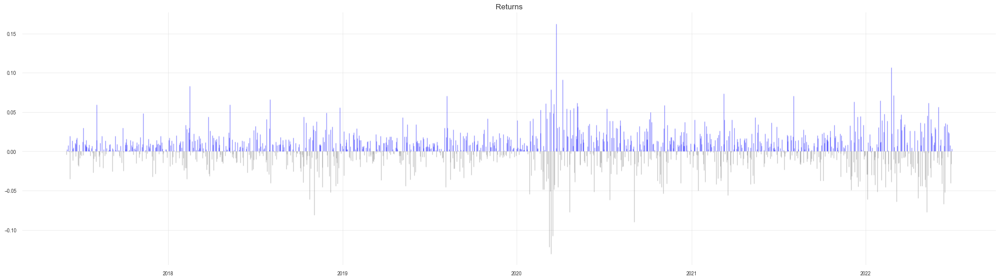

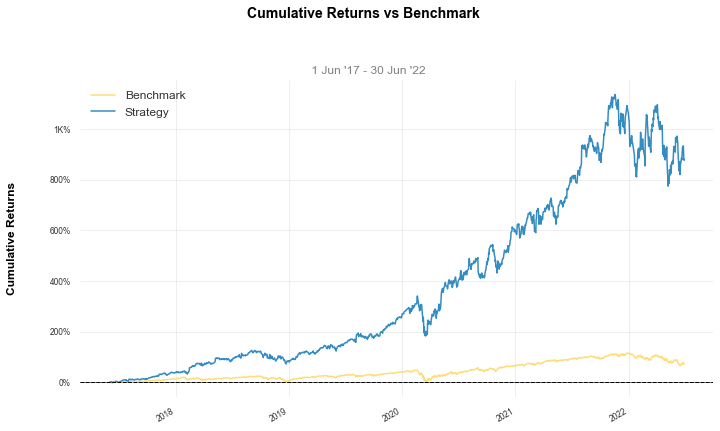

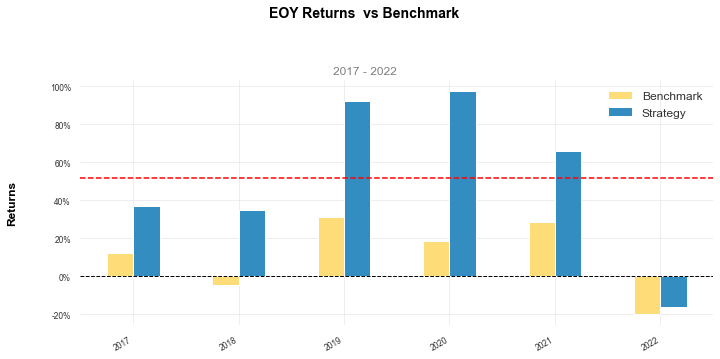

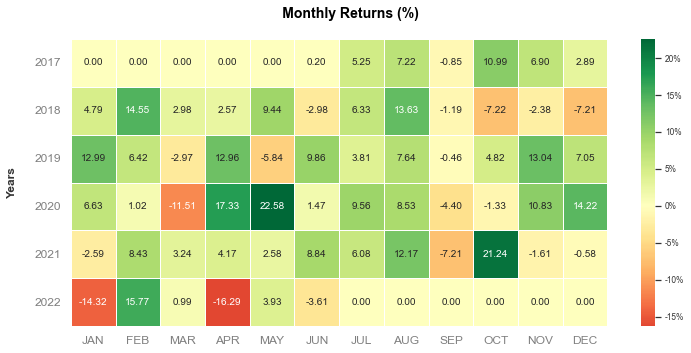

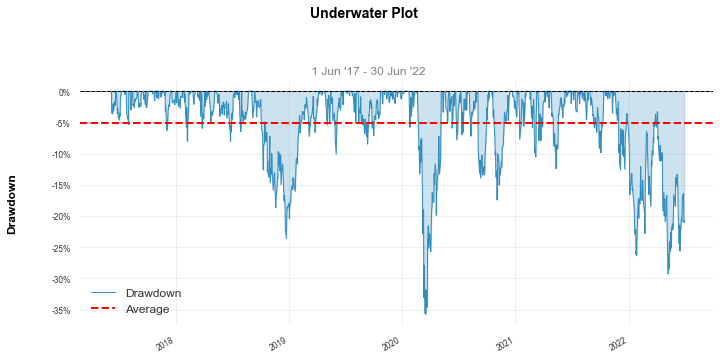

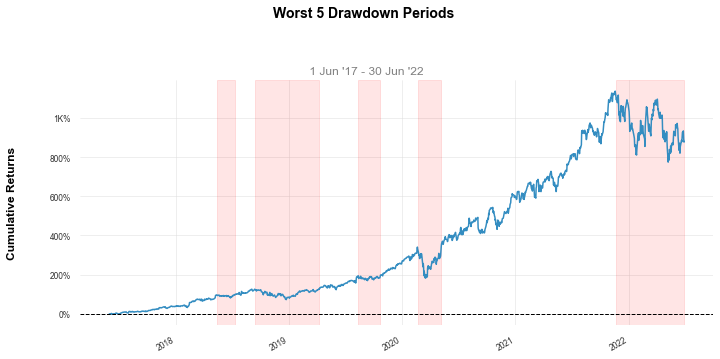

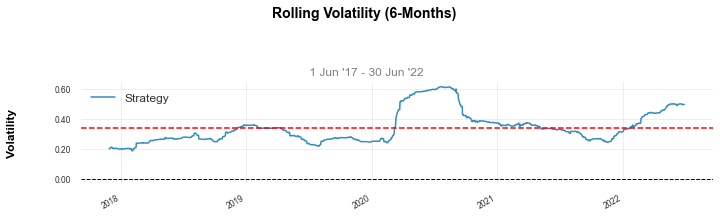

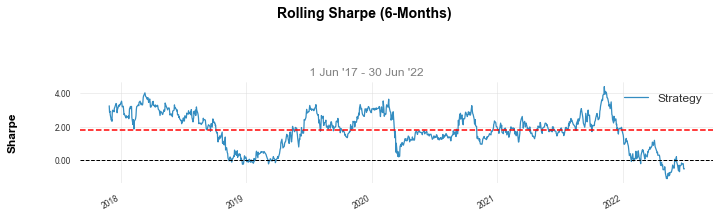

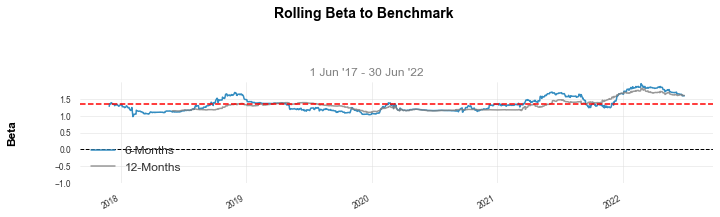

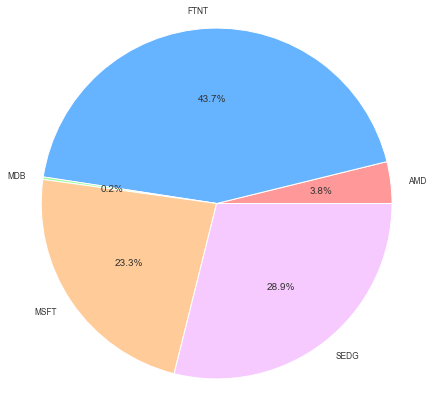

(None, None, None, None, None, None, None, None, None)

In [6]:
#!pip install sua
from sua import sua,get_report, Start

portfolio = Start(
    start_date = "2017-06-01",
    end_date= "2022-07-01",
    portfolio= [ "AAPL", "AMD","FTNT","MDB", "MSFT", "SEDG"],
    optimizer = "EF",
    #rebalance = "1y",  # rebalance every year
    risk_manager = {"Stop Loss" : -0.2} # Stop the investment when the drawdown becomes superior to -20%
)
#portfolio=Start.reshape(6,5)

sua(portfolio) #For showing in JupyterNotebook
#get_report(portfolio) #if you want to print wirh pdf form, plz use this.

In [ ]:
from sua import prediction
  
prediction(
      portfolio=["AAPL", "AMD","FTNT","MDB", "MSFT", "SEDG"], #stocks you want to predict
      start_date = "2017-06-01",#date from which it will take data to predict
      end_date= "2022-07-01",
      #weights = [0.3, 0.2, 0.3, 0.2,0.2], #allocate 30% to TSLA and 20% to AAPL...(equal weighting  by default)
      prediction_days=30 #number of days you want to predict
)
  

Evaluating the models for AAPL...
Models evaluated!
Making the predictions for AAPL...
Predictions generated!
Evaluating the models for AMD...
Models evaluated!
Making the predictions for AMD...
Predictions generated!
Evaluating the models for FTNT...
Models evaluated!
Making the predictions for FTNT...
Predictions generated!
Evaluating the models for MDB...
Models evaluated!
Making the predictions for MDB...
Predictions generated!
Evaluating the models for MSFT...


In [4]:
import pandas as pd
AAPL = pd.read_csv('nasdaqtechend.csv')
AAPL= AAPL[['Date', 'AAPL']]

CDNS = pd.read_csv('nasdaqtechend.csv')
CDNS = CDNS[['Date', 'CDNS']]

AMD = pd.read_csv('nasdaqtechend.csv')
AMD = AMD[['Date', 'AMD']]

FTNT = pd.read_csv('nasdaqtechend.csv')
FTNT = FTNT[['Date', 'FTNT']]

MDB = pd.read_csv('nasdaqtechend.csv')
MDB = MDB[['Date', 'MDB']]

MSFT = pd.read_csv('nasdaqtechend.csv')
MSFT = MSFT[['Date', 'MSFT']]

SEDG = pd.read_csv('nasdaqtechend.csv')
SEDG = SEDG[['Date', 'SEDG']]

# Progression and Prediction 

## AAPL (Apple)

In [12]:

fig1 = go.Figure()
fig1.add_trace(
    go.Scatter(
        x=AAPL.Date,
        y=AAPL.AAPL,
        name='AAPL Progression '
        
    
    )
)

In [100]:
AAPL_pre = AAPL.rename(columns={
    'Date': 'ds',
    'AAPL': 'y'
})

AAPL_pre

,ds,y
0,2017-06-01,36.252579
1,2017-06-02,36.789810
2,2017-06-05,36.430080
3,2017-06-06,36.553139
4,2017-06-07,36.770878
...,...,...
1276,2022-06-27,141.660004
1277,2022-06-28,137.440002
1278,2022-06-29,139.229996
1279,2022-06-30,136.720001


### Meta Prophet Prediction model

In [101]:
from prophet import Prophet
m = Prophet(
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=True,
    seasonality_mode='additive'
    
)


m.fit(AAPL_pre)
future =m.make_future_dataframe(periods = 30)

future.tail(30)

2022-07-26 06:50:32 cmdstanpy DEBUG: cmd: where.exe tbb.dll
cwd: None
2022-07-26 06:50:32.544 DEBUG   cmdstanpy: cmd: where.exe tbb.dll
cwd: None
2022-07-26 06:50:36 cmdstanpy DEBUG: TBB already found in load path
2022-07-26 06:50:36.704 DEBUG   cmdstanpy: TBB already found in load path
2022-07-26 06:50:37 cmdstanpy DEBUG: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\9mmbabzv.json
2022-07-26 06:50:37.272 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\9mmbabzv.json
2022-07-26 06:50:37 cmdstanpy DEBUG: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\4mmoh59h.json
2022-07-26 06:50:37.367 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\4mmoh59h.json
2022-07-26 06:50:37 cmdstanpy DEBUG: idx 0
2022-07-26 06:50:37.531 DEBUG   cmdstanpy: idx 0
2022-07-26 06:50:37 cmdstanpy DEBUG: running CmdStan, num_threads: None
2022-07-26 06:50:37.532 DEBUG   cmdstanpy: running CmdStan, num_threads: None
2022-0

,ds
1281,2022-07-02
1282,2022-07-03
1283,2022-07-04
1284,2022-07-05
1285,2022-07-06
1286,2022-07-07
1287,2022-07-08
1288,2022-07-09
1289,2022-07-10
1290,2022-07-11


In [102]:
df_no_weekdays = future[future['ds'].dt.dayofweek < 5]
df_no_weekdays

,ds
0,2017-06-01
1,2017-06-02
2,2017-06-05
3,2017-06-06
4,2017-06-07
...,...
1304,2022-07-25
1305,2022-07-26
1306,2022-07-27
1307,2022-07-28


In [ ]:
#df_no_weekdays.to_csv('dscommon.csv')

In [ ]:
#AAPL_pre.to_csv('AAPL_pre.csv')

In [148]:
#AAPL_done = pd.read_csv('AAPL_done.csv')
#AAPL_done

,ds,y
0,2017-06-01,36.252575
1,2017-06-02,36.789818
2,2017-06-05,36.430077
3,2017-06-06,36.553143
4,2017-06-07,36.770874
...,...,...
1295,2022-07-25,NaN
1296,2022-07-26,NaN
1297,2022-07-27,NaN
1298,2022-07-28,NaN


In [103]:
forecast = m.predict(future)

forecast[['ds', 'yhat','yhat_lower', 'yhat_upper']].tail(30)

,ds,yhat,yhat_lower,yhat_upper
1281,2022-07-02,165.723933,156.280286,175.510925
1282,2022-07-03,165.790222,155.450714,174.964443
1283,2022-07-04,165.856511,156.805683,175.399056
1284,2022-07-05,165.922800,156.611391,175.816727
1285,2022-07-06,165.989089,155.888867,175.403957
1286,2022-07-07,166.055378,156.616652,176.232304
1287,2022-07-08,166.121667,155.860973,176.059800
1288,2022-07-09,166.187956,156.168610,176.138634
1289,2022-07-10,166.254246,156.992182,176.114407
1290,2022-07-11,166.320535,156.812415,176.574378


In [104]:
df_no_weekdays = forecast[forecast['ds'].dt.dayofweek < 5]
df_no_weekdays

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-06-01,35.885408,25.023327,44.683805,35.885408,35.885408,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,34.991158
1,2017-06-02,35.912162,25.211330,45.396780,35.912162,35.912162,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,35.017911
2,2017-06-05,35.992421,25.458974,45.643555,35.992421,35.992421,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,35.098171
3,2017-06-06,36.019174,25.311925,44.836022,36.019174,36.019174,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,35.124924
4,2017-06-07,36.045928,25.770004,45.491855,36.045928,36.045928,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,35.151678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,2022-07-25,168.142832,157.616364,176.885370,168.106890,168.228323,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,167.248582
1305,2022-07-26,168.209121,157.334487,177.931089,168.161063,168.305770,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,167.314871
1306,2022-07-27,168.275411,157.074446,176.514056,168.218873,168.382732,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,167.381160
1307,2022-07-28,168.341700,157.710854,177.571697,168.271277,168.460949,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,-0.89425,0.0,0.0,0.0,167.447450


In [108]:
fig = plot_plotly(m, df_no_weekdays)
py.iplot(fig)

In [109]:
m1 = Prophet(
    changepoint_prior_scale=0.25, # increasing it will make the trend more flexible
    changepoint_range=0.97, # place potential changepoints in the first 98% of the time series
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=True,
    seasonality_mode='multiplicative'
)

m1.fit(AAPL_pre)

future1 = m1.make_future_dataframe(periods=30)
forecast1 = m1.predict(future1)
df_no_weekdays1 = forecast1[forecast1['ds'].dt.dayofweek < 5]
#forecast[['ds', 'yhat','yhat_lower', 'yhat_upper']].tail(20)
fig1 = plot_plotly(m1, df_no_weekdays1)
py.iplot(fig1)

2022-07-26 06:53:16 cmdstanpy DEBUG: cmd: where.exe tbb.dll
cwd: None
2022-07-26 06:53:16.617 DEBUG   cmdstanpy: cmd: where.exe tbb.dll
cwd: None
2022-07-26 06:53:16 cmdstanpy DEBUG: TBB already found in load path
2022-07-26 06:53:16.837 DEBUG   cmdstanpy: TBB already found in load path
2022-07-26 06:53:16 cmdstanpy DEBUG: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\xk73fh7p.json
2022-07-26 06:53:16.862 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\xk73fh7p.json
2022-07-26 06:53:16 cmdstanpy DEBUG: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\ft4fej7k.json
2022-07-26 06:53:16.873 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpxilduzrp\ft4fej7k.json
2022-07-26 06:53:16 cmdstanpy DEBUG: idx 0
2022-07-26 06:53:16.880 DEBUG   cmdstanpy: idx 0
2022-07-26 06:53:16 cmdstanpy DEBUG: running CmdStan, num_threads: None
2022-07-26 06:53:16.882 DEBUG   cmdstanpy: running CmdStan, num_threads: None
2022-0

In [87]:
import pandas_datareader as web
ticker = ["AAPL"]
AAPL2 = pd.DataFrame
AAPL2 = web.DataReader(ticker,'yahoo', start= '2017-06-01',end= '2022-07-05')
#AAPL2 = AAPL2[:-1]             
                                           
        
        
AAPL2

Attributes,Adj Close,Close,High,Low,Open,Volume
Symbols,AAPL,AAPL,AAPL,AAPL,AAPL,AAPL
Date,,,,,,
2017-06-01,36.252575,38.294998,38.332500,38.055000,38.292500,65616400.0
2017-06-02,36.789810,38.862499,38.862499,38.222500,38.395000,111082800.0
2017-06-05,36.430073,38.482498,38.612499,38.365002,38.584999,101326800.0
2017-06-06,36.553143,38.612499,38.952499,38.445000,38.474998,106499600.0
2017-06-07,36.770885,38.842499,38.994999,38.619999,38.755001,84278400.0
...,...,...,...,...,...,...
2022-06-28,137.440002,137.440002,143.419998,137.320007,142.130005,67083400.0
2022-06-29,139.229996,139.229996,140.669998,136.669998,137.460007,66242400.0


In [88]:
#정규화
def min_max_scaling(x):
    x_np = np.asarray(x)
    return (x_np - x_np.min()) / (x_np.max() - x_np.min() + 1e-7 ) #1e-7은 0으로 나누는 오류 예방차
    
#역정규화 : 정규화된 값을 원래의 값으로 되돌림
def reverse_min_max_scaling(org_x, x): #종가 예측값
    org_x_np = np.asarray(org_x) 
    x_np = np.asarray(x)
    return (x_np * (org_x_np.max() - org_x_np.min() + 1e-7)) + org_x_np.min()

In [89]:
input_dcm_cnt = 10 #입력데이터의 컬럼 개수
output_dcm_cnt = 1 #결과데이터의 컬럼 개수

seq_length = 28 #1개 시퀸스의 길이(시계열데이터 입력 개수)
rnn_cell_hidden_dim = 20 #각 셀의 히든 출력 크기
forget_bias = 1.0 #망각편향(기본값 1.0)
num_stacked_layers = 1 #Stacked LSTM Layers 개수
keep_prob = 1.0 #Dropout 할때 Keep할 비율

epoch_num = 1000 #에포크 횟수 (몇회 반복 학습)
learning_rate = 0.01 #학습률

In [90]:
stock_info = AAPL2.values[1:].astype(np.float)
stock_info

array([[3.67898102e+01, 3.88624992e+01, 3.88624992e+01, 3.82224998e+01,
        3.83950005e+01, 1.11082800e+08],
       [3.64300728e+01, 3.84824982e+01, 3.86124992e+01, 3.83650017e+01,
        3.85849991e+01, 1.01326800e+08],
       [3.65531425e+01, 3.86124992e+01, 3.89524994e+01, 3.84449997e+01,
        3.84749985e+01, 1.06499600e+08],
       ...,
       [1.36720001e+02, 1.36720001e+02, 1.38369995e+02, 1.33770004e+02,
        1.37250000e+02, 9.89645000e+07],
       [1.38929993e+02, 1.38929993e+02, 1.39039993e+02, 1.35660004e+02,
        1.36039993e+02, 7.10075000e+07],
       [1.41559998e+02, 1.41559998e+02, 1.41610001e+02, 1.36929993e+02,
        1.37770004e+02, 7.33538000e+07]])

In [91]:
price = stock_info[:,:-1] # <- here
norm_price = min_max_scaling(price)
norm_price.shape #Jupyter Notebook, etc environment = print(price.shape)

(1281, 5)

In [92]:
volume = stock_info[:,-1:] # <- here
norm_volume = min_max_scaling(volume)
norm_volume.shape

(1281, 1)

In [93]:
x = np.concatenate((norm_price, norm_volume), axis=1) 
y = x[:, [-2]] 
dataX = [] 
dataY = [] 

for i in range(0, len(y) - seq_length):
    _x = x[i:i+seq_length] 
    _y = y[i+seq_length] 
    if i is 0:
        print(_x, "->", _y)
    dataX.append(_x)
    dataY.append(_y)
train_size = int(len(dataY) * 0.7) 
test_size = len(dataY) - train_size 

[[0.02089678 0.03478234 0.03478234 0.03049479 0.03165043 0.18179243]
 [0.0184868  0.0322366  0.03310751 0.03144946 0.03292328 0.15648569]
 [0.01931128 0.03310751 0.03538528 0.03198539 0.03218636 0.16990376]
 [0.02077    0.03464835 0.03566999 0.03315776 0.03406218 0.11226272]
 [0.0201675  0.03401193 0.03493307 0.03302377 0.03444738 0.11414282]
 [0.01063862 0.02394623 0.03434689 0.01898876 0.03434689 0.56686156]
 [0.00499416 0.01798386 0.01910599 0.01311012 0.01851981 0.64389821]
 [0.00684926 0.0199434  0.02138375 0.01753165 0.02089806 0.24814298]
 [0.004582   0.01754841 0.0214675  0.01533763 0.0214675  0.22081087]
 [0.00320265 0.0160913  0.01640952 0.01260769 0.01446674 0.22739125]
 [0.         0.01270817 0.01644302 0.01259092 0.01523715 0.41618739]
 [0.00645286 0.01952469 0.02019464 0.01503618 0.01503618 0.23129257]
 [0.0043442  0.01729718 0.02041235 0.01717995 0.02041235 0.15200747]
 [0.00570776 0.01873752 0.01907251 0.01662726 0.01815135 0.11429846]
 [0.00532723 0.01833558 0.02012763

In [94]:
train_size = int(len(dataY) * 0.7)
test_size = len(dataY) - train_size 

trainX = np.array(dataX[0:train_size])
trainY = np.array(dataY[0:train_size])

testX = np.array(dataX[train_size:len(dataX)])
testY = np.array(dataY[train_size:len(dataY)])

In [95]:
X = tf.placeholder(tf.float32, [None,seq_length, input_dcm_cnt])
Y = tf.placeholder(tf.float32, [None,1])
print("X:",X)
print("Y:",Y)

targets = tf.placeholder(tf.float32, [None, 1])
predictions = tf.placeholder(tf.float32, [None, 1])
print("targets", targets)
print("predictions", predictions)

AttributeError: module 'tensorflow' has no attribute 'placeholder'

In [ ]:
import tensorflow.compat.v1 as tf1
tf1.disable_v2_behavior() 
import tensorflow as tf2 #Tensorflow 2.x

(num_units=10,
                            state_is_tuple=True,
                            initializer= tf2.initializers.GlorotUniform()
                           ) 

In [ ]:

def lstm_cell():
    cell = tf.contrib.rnn.BasicLSTMCell(num_units=rnn_cell_hidden_dim,
                                       forget_bias=forget_bias, 
                                       state_is_tuple=True,
                                       activation=tf.nn.softsign) 
    if keep_prob < 1.0 :
        cell = tf.contrib.rnn.DropoutWrapper(cell, output_keep_prob=keep_prob)
    return cell

In [ ]:
 

stackedRNNs = [lstm_cell()for _ in range(num_stacked_layers)] #Stacked LSTM Layers 개수 1
multi_cells = tf.contrib.rnn.MultiRNNCell(stackedRNNs, state_is_tuple=True)if num_stacked_layers > 1 else lstm_cell()

hypothesis, _states = tf.nn.dynamic_rnn(multi_cells, X, dtype=tf.float32)
hypothesis = tf.contrib.layers.fully_connected(hypothesis[:,-1], output_dcm_cnt, activation_fn=tf.identity)
hypothesis.shape

In [ ]:
loss = tf.reduce_sum(tf.square(hypothesis - Y))
optimizer = tf.train.AdamOptimizer(learning_rate)
train = optimizer.minimize(loss)

rmse = tf.sqrt(tf.reduce_mean(tf.squared_difference(targets, predictions)))

In [ ]:
AAPL2.isnull().sum()

In [ ]:
high_prices = AAPL2['High'].values
low_prices = AAPL2['Low'].values
#mid_prices = (high_prices + low_prices)/2
prices = AAPL2['Close'].values

In [ ]:
seq_len = 28
sequence_length = seq_len +1

result = []
for index in range(len(prices) - sequence_length):
    result.append(prices[index: index + sequence_length])

In [ ]:
normalized_data = []
for window in result:
    normalized_window = [((float(p) / float(window[0])) -1) for p in window]
    normalized_data.append(normalized_window)
    
result = np.array(normalized_data)

row = int(round(result.shape[0]*0.9)) ## 전체의 0.9만큼 트레이닝 하도록 설계
train = result[:row, :]
np.random.shuffle(train) ## 하나의 트레이닝셋에만 익숙해지지 않게 셔플하여 러닝시킴

x_train = train[:, :-1]
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
y_train = train[:, -1]

x_test = result[row:, :-1]
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))
y_test = result[row:, -1]

x_train.shape, x_test.shape

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense, Activation
model = Sequential()
model.add(LSTM(28, return_sequences= True, input_shape=(28, 1)))
model.add(LSTM(28, return_sequences= False)) ##LSTM 뒤의 숫자는 조정하며 성능 비교 가능
model.add(Dense(1, activation='linear'))
model.compile(loss='mse', optimizer='rmsprop') # MSE = Mean Squared Error / 
model.summary()

In [ ]:
fig1 = m1.plot(forecast1)
a = add_changepoints_to_plot(fig1.gca(), m1, forecast1)

### AAPL XGBoost Model Prediction

In [53]:
import os
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV

# Time series decomposition
#!pip install stldecompose
from statsmodels.tsa.seasonal import seasonal_decompose

# Chart drawing
import plotly as py
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Mute sklearn warnings
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=DeprecationWarning)

# Show charts when running kernel
init_notebook_mode(connected=True)

# Change default background color for all visualizations
layout=go.Layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(250,250,250,0.8)')
fig = go.Figure(layout=layout)
templated_fig = pio.to_templated(fig)
pio.templates['my_template'] = templated_fig.layout.template
pio.templates.default = 'my_template'

In [59]:
import pandas_datareader as web
#ticker = pd.read_csv('./nasdaq_techundtelelar77.csv')['Symbol']
AAPL3 = pd.DataFrame
AAPL3 = web.DataReader('AAPL','yahoo', start= '2017-06-01',end= '2022-07-01')
                                                        
        
        
AAPL3.to_csv('AAPL_hist_price.csv')

In [64]:
AAPL3 = pd.read_csv('AAPL_hist_price.csv')
AAPL3

,Date,High,Low,Open,Close,Volume,Adj_Close
0,2017-06-01,38.332500,38.055000,38.292500,38.294998,65616400,36.252583
1,2017-06-02,38.862499,38.222500,38.395000,38.862499,111082800,36.789818
2,2017-06-05,38.612499,38.365002,38.584999,38.482498,101326800,36.430077
3,2017-06-06,38.952499,38.445000,38.474998,38.612499,106499600,36.553143
4,2017-06-07,38.994999,38.619999,38.755001,38.842499,84278400,36.770878
...,...,...,...,...,...,...,...
1276,2022-06-27,143.490005,140.970001,142.699997,141.660004,70207900,141.660004
1277,2022-06-28,143.419998,137.320007,142.130005,137.440002,67083400,137.440002
1278,2022-06-29,140.669998,136.669998,137.460007,139.229996,66242400,139.229996
1279,2022-06-30,138.369995,133.770004,137.250000,136.720001,98964500,136.720001


In [65]:
AAPL3['Date'] = pd.to_datetime(AAPL3['Date'])
AAPL3 = AAPL3[(AAPL3['Date'].dt.year >= 2017)].copy()
AAPL3.index = range(len(AAPL3))

In [66]:
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Ohlc(x=AAPL3.Date,
                      open=AAPL3.Open,
                      high=AAPL3.High,
                      low=AAPL3.Low,
                      close=AAPL3.Adj_Close,
                      name='Price'), row=1, col=1)

fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.Volume, name='Volume'), row=2, col=1)

fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

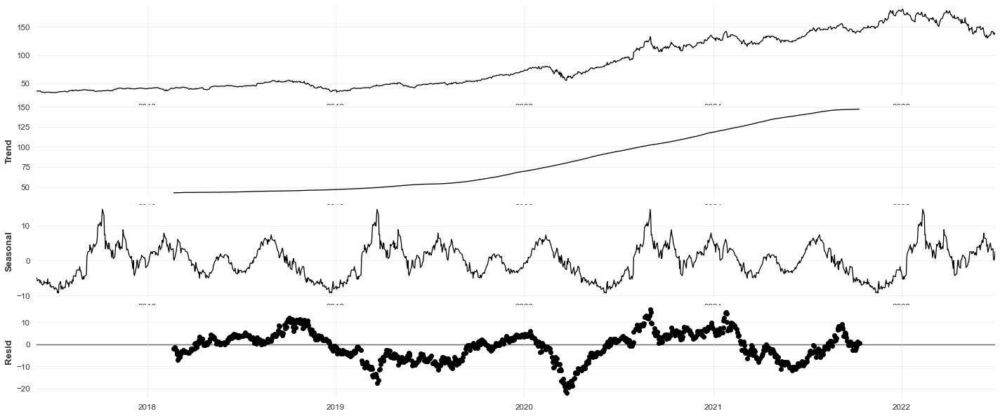

In [67]:
AAPL3_close = AAPL3[['Date', 'Adj_Close']].copy()
AAPL3_close = AAPL3_close.set_index('Date')
AAPL3_close.head()

decomp = seasonal_decompose(AAPL3_close, period=365)
fig = decomp.plot()
fig.set_size_inches(20, 8)

In [68]:
AAPL3['EMA_9'] = AAPL3['Adj_Close'].ewm(9).mean().shift()
AAPL3['SMA_5'] = AAPL3['Adj_Close'].rolling(5).mean().shift()
AAPL3['SMA_10'] = AAPL3['Adj_Close'].rolling(10).mean().shift()
AAPL3['SMA_15'] = AAPL3['Adj_Close'].rolling(15).mean().shift()
AAPL3['SMA_30'] = AAPL3['Adj_Close'].rolling(30).mean().shift()

fig = go.Figure()
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.EMA_9, name='EMA 9'))
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.SMA_5, name='SMA 5'))
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.SMA_10, name='SMA 10'))
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.Close, name='Adj_Close', opacity=0.2))
fig.show()

In [69]:
def relative_strength_idx(AAPL3, n=14):
    close = AAPL3['Adj_Close']
    delta = close.diff()
    delta = delta[1:]
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp < 0] = 0
    pricesDown[pricesDown > 0] = 0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp / rollDown
    rsi = 100.0 - (100.0 / (1.0 + rs))
    return rsi

AAPL3['RSI'] = relative_strength_idx(AAPL3).fillna(0)

fig = go.Figure(go.Scatter(x=AAPL3.Date, y=AAPL3.RSI, name='RSI'))
fig.show()

In [70]:
#MACD

EMA_12 = pd.Series(AAPL3['Adj_Close'].ewm(span=12, min_periods=12).mean())
EMA_26 = pd.Series(AAPL3['Adj_Close'].ewm(span=26, min_periods=26).mean())
AAPL3['MACD'] = pd.Series(EMA_12 - EMA_26)
AAPL3['MACD_signal'] = pd.Series(AAPL3.MACD.ewm(span=9, min_periods=9).mean())

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.Adj_Close, name='Adj_Close'), row=1, col=1)
fig.add_trace(go.Scatter(x=AAPL3.Date, y=EMA_12, name='EMA 12'), row=1, col=1)
fig.add_trace(go.Scatter(x=AAPL3.Date, y=EMA_26, name='EMA 26'), row=1, col=1)
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3['MACD'], name='MACD'), row=2, col=1)
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3['MACD_signal'], name='Signal line'), row=2, col=1)
fig.show()

In [71]:
AAPL3['Adj_Close'] = AAPL3['Adj_Close'].shift(-1)

In [72]:
AAPL3 = AAPL3.iloc[33:] # Because of moving averages and MACD line
AAPL3 = AAPL3[:-1]      # Because of shifting close price

AAPL3.index = range(len(AAPL3))

In [73]:
test_size  = 0.1
valid_size = 0.1

test_split_idx  = int(AAPL3.shape[0] * (1-test_size))
valid_split_idx = int(AAPL3.shape[0] * (1-(valid_size+test_size)))

train_df  = AAPL3.loc[:valid_split_idx].copy()
valid_df  = AAPL3.loc[valid_split_idx+1:test_split_idx].copy()
test_df   = AAPL3.loc[test_split_idx+1:].copy()

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_df.Date, y=train_df.Adj_Close, name='Training'))
fig.add_trace(go.Scatter(x=valid_df.Date, y=valid_df.Adj_Close, name='Validation'))
fig.add_trace(go.Scatter(x=test_df.Date,  y=test_df.Adj_Close,  name='Test'))
fig.show()

In [74]:
drop_cols = ['Date', 'Volume', 'Open', 'Low', 'High','Close']

train_df = train_df.drop(drop_cols, 1)
valid_df = valid_df.drop(drop_cols, 1)
test_df  = test_df.drop(drop_cols, 1)

In [75]:
y_train = train_df['Adj_Close'].copy()
X_train = train_df.drop(['Adj_Close'], 1)

y_valid = valid_df['Adj_Close'].copy()
X_valid = valid_df.drop(['Adj_Close'], 1)

y_test  = test_df['Adj_Close'].copy()
X_test  = test_df.drop(['Adj_Close'], 1)

X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998 entries, 0 to 997
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   EMA_9        998 non-null    float64
 1   SMA_5        998 non-null    float64
 2   SMA_10       998 non-null    float64
 3   SMA_15       998 non-null    float64
 4   SMA_30       998 non-null    float64
 5   RSI          998 non-null    float64
 6   MACD         998 non-null    float64
 7   MACD_signal  998 non-null    float64
dtypes: float64(8)
memory usage: 62.5 KB


In [76]:
%%time

parameters = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.001, 0.005, 0.01, 0.05],
    'max_depth': [8, 10, 12, 15],
    'gamma': [0.001, 0.005, 0.01, 0.02],
    'random_state': [42]
}

eval_set = [(X_train, y_train), (X_valid, y_valid)]
model = xgb.XGBRegressor(eval_set=eval_set, objective='reg:squarederror', verbose=False)
clf = GridSearchCV(model, parameters)

clf.fit(X_train, y_train)

print(f'Best params: {clf.best_params_}')
print(f'Best validation score = {clf.best_score_}')

[06:17:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:17:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:17:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:17:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:17:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:17:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:17:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:18:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:18:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par


[06:19:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some pa

[06:19:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:19:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:20:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:20:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:20:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:20:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:20:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:20:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:20:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:20:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:21:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:21:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:22:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:22:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:23:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:23:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:23:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:23:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

[06:23:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:23:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "eval_set", "verbose" } might not be used.

  This may not be accurate due to some par

In [79]:
%%time

model = xgb.XGBRegressor(**clf.best_params_, objective='reg:squarederror')
model.fit(X_train, y_train, eval_set=eval_set, verbose=False)

Wall time: 899 ms


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0.001, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=8,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=300, n_jobs=16, num_parallel_tree=1, random_state=42,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

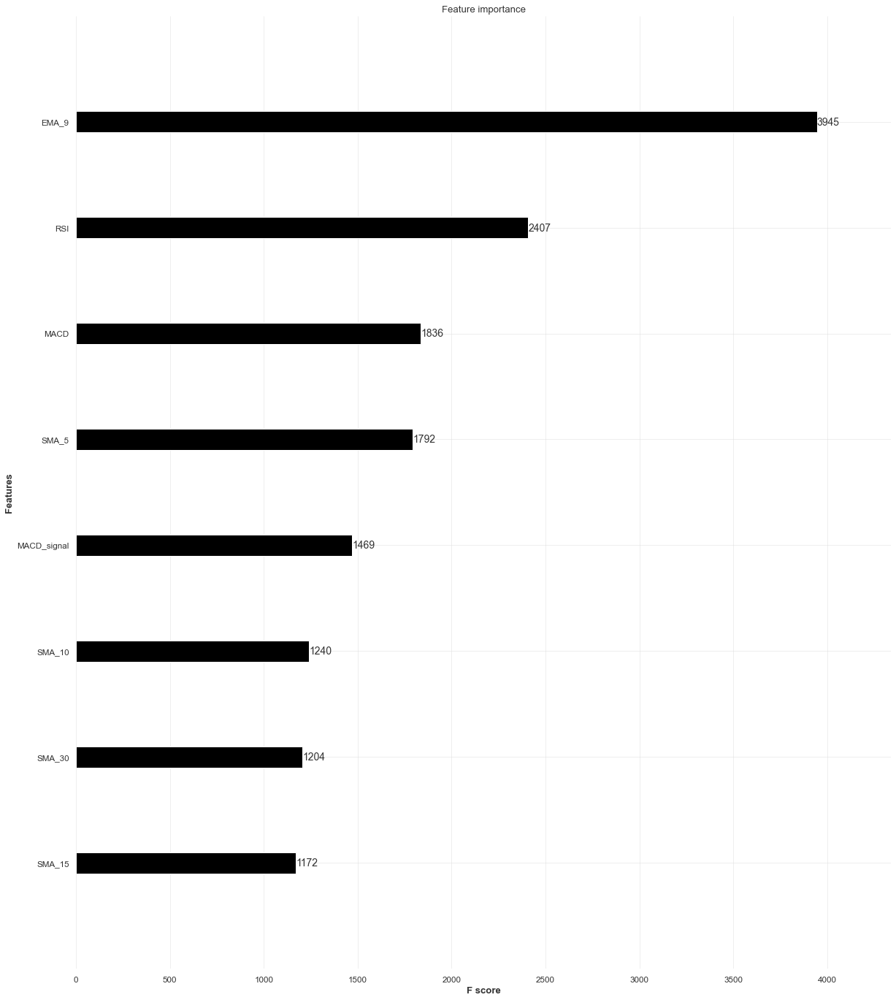

In [80]:
plot_importance(model);

In [81]:
y_pred = model.predict(X_test)
print(f'y_true = {np.array(y_test)[:5]}')
print(f'y_pred = {y_pred[:5]}')

y_true = [179.2080383 174.4411316 171.5291138 171.6986542 171.7185974]
y_pred = [130.72328 130.0156  125.24902 127.10397 130.45857]


In [82]:
print(f'mean_squared_error = {mean_squared_error(y_test, y_pred)}')

mean_squared_error = 961.4951855988219


In [83]:
predicted_prices = AAPL3.loc[test_split_idx+1:].copy()
predicted_prices['Adj_Close'] = y_pred

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=AAPL3.Date, y=AAPL3.Adj_Close,
                         name='Truth',
                         marker_color='LightSkyBlue'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=predicted_prices.Adj_Close,
                         name='Prediction',
                         marker_color='MediumPurple'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=y_test,
                         name='Truth',
                         marker_color='LightSkyBlue',
                         showlegend=False), row=2, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=y_pred,
                         name='Prediction',
                         marker_color='MediumPurple',
                         showlegend=False), row=2, col=1)

fig.show()

In [86]:
import math
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import time
import pandas_datareader.data as web

from datetime import date, datetime, time, timedelta
from matplotlib import pyplot as plt
from pylab import rcParams
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from tqdm import tqdm_notebook

%matplotlib inline


test_size = 0.2                 # proportion of dataset to be used as test set
cv_size = 0.2                   # proportion of dataset to be used as cross-validation set
Nmax = 30                       # for feature at day t, we use lags from t-1, t-2, ..., t-N as features
                                # Nmax is the maximum N we are going to test
fontsize = 14
ticklabelsize = 14

In [107]:
def get_preds_lin_reg(df, target_col, N, pred_min, offset):
    """
    Given a dataframe, get prediction at timestep t using values from t-1, t-2, ..., t-N.
    Inputs
        df         : dataframe with the values you want to predict. Can be of any length.
        target_col : name of the column you want to predict e.g. 'adj_close'
        N          : get prediction at timestep t using values from t-1, t-2, ..., t-N
        pred_min   : all predictions should be >= pred_min
        offset     : for df we only do predictions for df[offset:]. e.g. offset can be size of training set
    Outputs
        pred_list  : the predictions for target_col. np.array of length len(df)-offset.
    """
    
    regr = LinearRegression(fit_intercept=True)

    pred_list = []

    for i in range(offset, len(df['Adj_Close'])):
        X_train = np.array(range(len(df['Adj_Close'][i-N:i]))) 
        y_train = np.array(df['Adj_Close'][i-N:i]) 
        X_train = X_train.reshape(-1, 1)     
              
        y_train = y_train.reshape(-1, 1)
    #     print X_train.shape
    #     print y_train.shape
    #     print 'X_train = \n' + str(X_train)
    #     print 'y_train = \n' + str(y_train)
        regr.fit(X_train, y_train)            
        pred = regr.predict(np.array(N).reshape(1,-1))
    
        pred_list.append(pred[0][0])  
    
    # If the values are < pred_min, set it to be pred_min
    pred_list = np.array(pred_list)
    pred_list[pred_list < pred_min] = pred_min
        
    return pred_list




def get_mape(y_true, y_pred): 
    """
    Compute mean absolute percentage error (MAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [92]:
df = pd.read_csv('AAPL_hist_price.csv')
df

,Date,High,Low,Open,Close,Volume,Adj_Close
0,2017-06-01,38.332500,38.055000,38.292500,38.294998,65616400,36.252583
1,2017-06-02,38.862499,38.222500,38.395000,38.862499,111082800,36.789814
2,2017-06-05,38.612499,38.365002,38.584999,38.482498,101326800,36.430069
3,2017-06-06,38.952499,38.445000,38.474998,38.612499,106499600,36.553143
4,2017-06-07,38.994999,38.619999,38.755001,38.842499,84278400,36.770882
...,...,...,...,...,...,...,...
1277,2022-06-28,143.419998,137.320007,142.130005,137.440002,67083400,137.440002
1278,2022-06-29,140.669998,136.669998,137.460007,139.229996,66242400,139.229996
1279,2022-06-30,138.369995,133.770004,137.250000,136.720001,98964500,136.720001
1280,2022-07-01,139.039993,135.660004,136.039993,138.929993,71007500,138.929993


In [93]:
df.columns

Index(['Date', 'High', 'Low', 'Open', 'Close', 'Volume', 'Adj_Close'], dtype='object')

In [94]:
# Convert Date column to datetime
df['Date'] = pd.to_datetime(df['Date'],format='%Y-%m-%d')
df

,Date,High,Low,Open,Close,Volume,Adj_Close
0,2017-06-01,38.332500,38.055000,38.292500,38.294998,65616400,36.252583
1,2017-06-02,38.862499,38.222500,38.395000,38.862499,111082800,36.789814
2,2017-06-05,38.612499,38.365002,38.584999,38.482498,101326800,36.430069
3,2017-06-06,38.952499,38.445000,38.474998,38.612499,106499600,36.553143
4,2017-06-07,38.994999,38.619999,38.755001,38.842499,84278400,36.770882
...,...,...,...,...,...,...,...
1277,2022-06-28,143.419998,137.320007,142.130005,137.440002,67083400,137.440002
1278,2022-06-29,140.669998,136.669998,137.460007,139.229996,66242400,139.229996
1279,2022-06-30,138.369995,133.770004,137.250000,136.720001,98964500,136.720001
1280,2022-07-01,139.039993,135.660004,136.039993,138.929993,71007500,138.929993


Text(0, 0.5, 'USD')

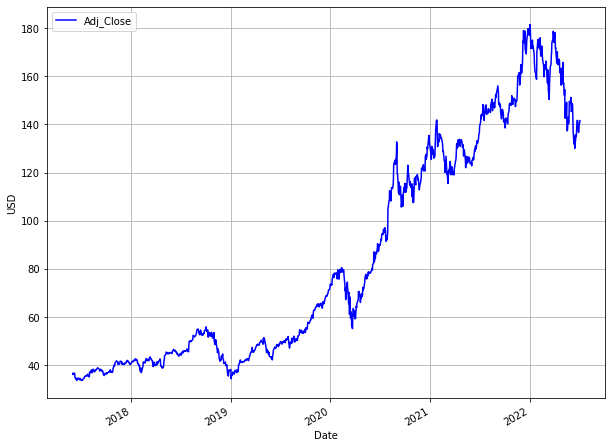

In [95]:
# Plot adjusted close over time
rcParams['figure.figsize'] = 10, 8 # width 10, height 8

ax = df.plot(x='Date', y='Adj_Close', style='b-', grid=True)
ax.set_xlabel("Date")
ax.set_ylabel("USD")

In [109]:
# Get sizes of each of the datasets
num_cv = int(cv_size*len(df))
num_test = int(test_size*len(df))
num_train = len(df) - num_cv - num_test
print("num_train = " + str(num_train))
print("num_cv = " + str(num_cv))
print("num_test = " + str(num_test))

# Split into train, cv, and test
train = df[:num_train].copy()
cv = df[num_train:num_train+num_cv].copy()
train_cv = df[:num_train+num_cv].copy()
test = df[num_train+num_cv:].copy()
print("train.shape = " + str(train.shape))
print("cv.shape = " + str(cv.shape))
print("train_cv.shape = " + str(train_cv.shape))
print("test.shape = " + str(test.shape))

num_train = 770
num_cv = 256
num_test = 256
train.shape = (770, 7)
cv.shape = (256, 7)
train_cv.shape = (1026, 7)
test.shape = (256, 7)


Text(0, 0.5, 'USD')

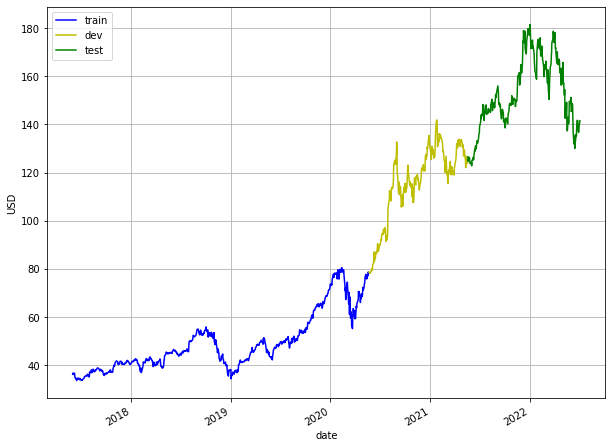

In [105]:
# Plot adjusted close over time
rcParams['figure.figsize'] = 10, 8 # width 10, height 8

ax = train_df.plot(x='Date', y='Adj_Close', style='b-', grid=True)
ax = valid_df.plot(x='Date', y='Adj_Close', style='y-', grid=True, ax=ax)
ax = test_df.plot(x='Date', y='Adj_Close', style='g-', grid=True, ax=ax)
ax.legend(['train', 'dev', 'test'])
ax.set_xlabel("date")
ax.set_ylabel("USD")

In [110]:
RMSE = []
R2 = []
mape = []
for N in range(1, Nmax+1): # N is no. of samples to use to predict the next value
    est_list = get_preds_lin_reg(train_cv, 'Adj_Close', N, 0, num_train)
    
    cv.loc[:, 'est' + '_N' + str(N)] = est_list
    RMSE.append(math.sqrt(mean_squared_error(est_list, cv['Adj_Close'])))
    R2.append(r2_score(cv['Adj_Close'], est_list))
    mape.append(get_mape(cv['Adj_Close'], est_list))
print('RMSE = ' + str(RMSE))
print('R2 = ' + str(R2))
print('MAPE = ' + str(mape))
cv.head()

RMSE = [2.5418583049638985, 3.7115248290011276, 3.1483807498356584, 3.085037803085546, 3.0853486168688664, 3.1677816142681072, 3.276704847823596, 3.3967339976370505, 3.474726559081889, 3.543250798071538, 3.6082011228146738, 3.6722513451750225, 3.7562182016512073, 3.8524298334400258, 3.959312185982967, 4.064755464360968, 4.16278512342096, 4.266845126337647, 4.342498425828294, 4.4048872174960625, 4.463635269920891, 4.524746551087043, 4.591644430962202, 4.664485736262551, 4.753565330769291, 4.851945074894979, 4.961973533262739, 5.067836612952337, 5.171954323200554, 5.272197526939928]
R2 = [0.9552415177382255, 0.9045716494582536, 0.9313331423663309, 0.9340683936417555, 0.9340551079152164, 0.9304842609164985, 0.9256215156689793, 0.9200725876425682, 0.9163600153557689, 0.9130285994068184, 0.9098108795775514, 0.906580513883851, 0.9022595571408834, 0.8971883920160089, 0.8914044148002354, 0.8855432199599628, 0.879955942965865, 0.8738792815865457, 0.8693672660221379, 0.8655866939241676, 0.861977

,Date,High,Low,Open,Close,Volume,Adj_Close,est_N1,est_N2,est_N3,...,est_N21,est_N22,est_N23,est_N24,est_N25,est_N26,est_N27,est_N28,est_N29,est_N30
770,2020-06-23,93.095001,90.567497,91.000000,91.632500,212155600,90.502151,88.610771,90.870056,89.032990,...,88.527759,88.387712,88.180238,88.097999,87.956764,87.943179,87.864008,87.799024,87.649664,87.435886
771,2020-06-24,92.197502,89.629997,91.250000,90.014999,192623200,88.904594,90.502151,92.393532,92.638802,...,89.606678,89.424600,89.275033,89.060882,88.966454,88.815856,88.788270,88.698387,88.622648,88.465839
772,2020-06-25,91.250000,89.392502,90.175003,91.209999,137522400,90.084862,88.904594,87.307037,89.632996,...,90.154843,90.064048,89.895436,89.755870,89.552754,89.462919,89.318252,89.291181,89.203825,89.129663
773,2020-06-26,91.330002,88.254997,91.102501,88.407501,205256800,87.316933,90.084862,91.265129,89.413246,...,90.812299,90.730658,90.644364,90.482626,90.347380,90.150052,90.060513,89.917721,89.887808,89.799714
774,2020-06-29,90.542503,87.820000,88.312500,90.445000,130646000,89.329292,87.316933,84.549004,87.181135,...,90.781483,90.775136,90.724676,90.666714,90.533629,90.423066,90.250314,90.178962,90.054610,90.037651


Text(0, 0.5, 'RMSE')

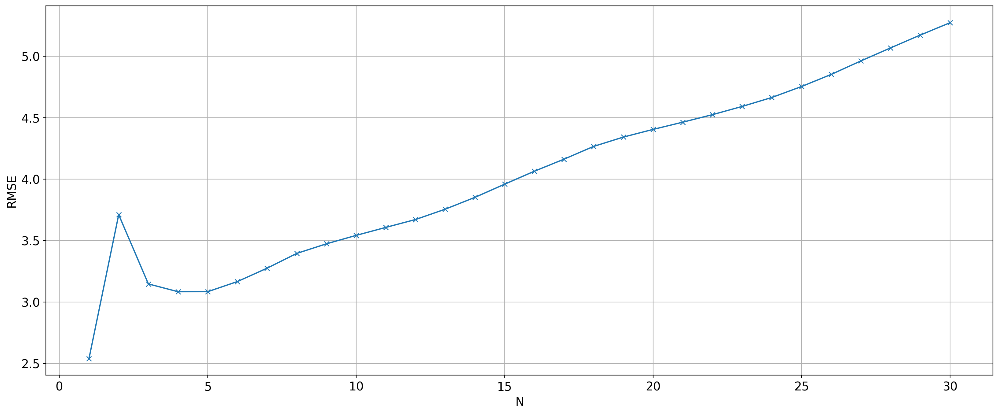

In [111]:
# Plot RMSE versus N
matplotlib.rcParams.update({'font.size': 14})
plt.figure(figsize=(20, 8), dpi=200)
plt.plot(range(1, Nmax+1), RMSE, 'x-')
plt.grid()
plt.xlabel('N')
plt.ylabel('RMSE')
#plt.xlim([2, 30])

Text(0, 0.5, 'R2')

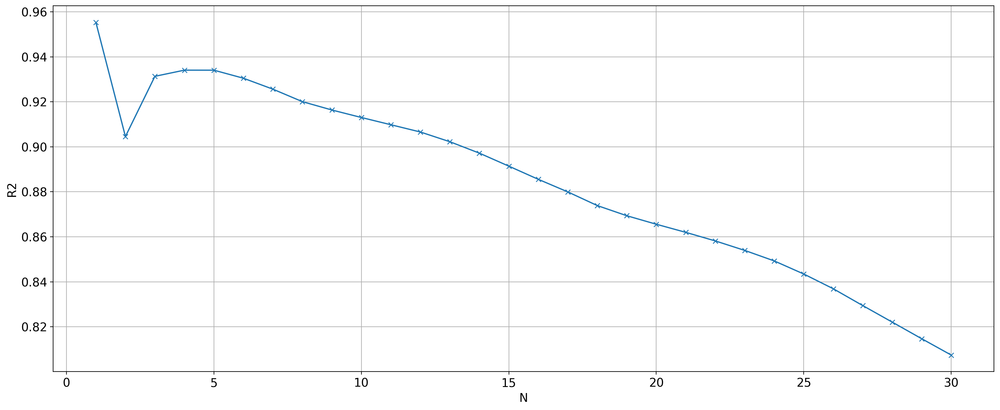

In [112]:
# Plot R2 versus N. Note for R2 larger better. 
matplotlib.rcParams.update({'font.size': 14})
plt.figure(figsize=(20, 8), dpi=200)
plt.plot(range(1, Nmax+1), R2, 'x-')
plt.grid()
plt.xlabel('N')
plt.ylabel('R2')


Text(0, 0.5, 'MAPE')

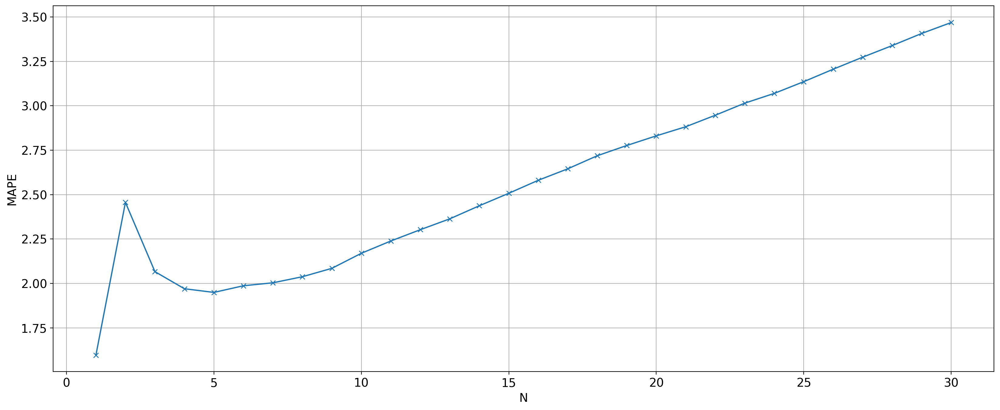

In [113]:
# Plot MAPE versus N. Note for MAPE smaller better. 
plt.figure(figsize=(20, 8), dpi=200)
plt.plot(range(1, Nmax+1), mape, 'x-')
plt.grid()
plt.xlabel('N')
plt.ylabel('MAPE')

In [116]:
N_opt= 5
est_list = get_preds_lin_reg(df, 'Adj_Close', N_opt, 0, num_train+num_cv)
test.loc[:, 'est' + '_N' + str(N_opt)] = est_list
print("RMSE = %0.3f" % math.sqrt(mean_squared_error(est_list, test['Adj_Close'])))
print("R2 = %0.3f" % r2_score(test['Adj_Close'], est_list))
print("MAPE = %0.3f%%" % get_mape(test['Adj_Close'], est_list))
test.head()

RMSE = 3.670
R2 = 0.917
MAPE = 1.858%


,Date,High,Low,Open,Close,Volume,Adj_Close,est_N5
1026,2021-06-29,136.490005,134.350006,134.800003,136.330002,64556100,135.555542,133.337241
1027,2021-06-30,137.410004,135.869995,136.169998,136.960007,63261400,136.181976,135.480974
1028,2021-07-01,137.330002,135.759995,136.600006,137.270004,52485800,136.490204,137.229987
1029,2021-07-02,140.000000,137.750000,137.899994,139.960007,78852600,139.164932,138.051283
1030,2021-07-06,143.149994,140.070007,140.070007,142.020004,108181800,141.213226,139.652145


In [117]:
import math
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_datareader.data as web
import time

from datetime import *
from matplotlib import pyplot as plt

from pylab import rcParams
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import *
from tqdm import tqdm_notebook
from xgboost import XGBRegressor
%matplotlib inline



test_size = 0.2                                                # proportion of dataset to be used as test set
cv_size = 0.2                                                   # proportion of dataset to be used as cross-validation set
N = 3                                                              # for feature at day t, we use lags from t-1, t-2, ..., t-N as features

n_estimators = 100                          # Number of boosted trees to fit. default = 100
max_depth = 3                               # Maximum tree depth for base learners. default = 3
learning_rate = 0.1                         # Boosting learning rate (xgb’s “eta”). default = 0.1
min_child_weight = 1                     # Minimum sum of instance weight(hessian) needed in a child. default = 1
subsample = 1                  # Subsample ratio of the training instance. default = 1
colsample_bytree = 1           # Subsample ratio of columns when constructing each tree. default = 1
colsample_bylevel = 1          # Subsample ratio of columns for each split, in each level. default = 1
gamma = 0                      # Minimum loss reduction required to make a further partition on a leaf node of the tree. default=0

model_seed = 100

fontsize = 14
ticklabelsize = 14

In [119]:
def get_mov_avg_std(df, col, N):
    """
    Given a dataframe, get mean and std dev at timestep t using values from t-1, t-2, ..., t-N.
    Inputs
        df         : dataframe. Can be of any length.
        col        : name of the column you want to calculate mean and std dev
        N          : get mean and std dev at timestep t using values from t-1, t-2, ..., t-N
    Outputs
        df_out     : same as df but with additional column containing mean and std dev
    """
    mean_list = df[col].rolling(window = N, min_periods=1).mean() 
    std_list = df[col].rolling(window = N, min_periods=1).std()   
    
    # Add one timestep to the predictions
    mean_list = np.concatenate((np.array([np.nan]), np.array(mean_list[:-1])))
    std_list = np.concatenate((np.array([np.nan]), np.array(std_list[:-1])))
    
    # Append mean_list to df
    df_out = df.copy()
    df_out[col + '_mean'] = mean_list
    df_out[col + '_std'] = std_list
    
    return df_out

def scale_row(row, feat_mean, feat_std):
    """
    Given a pandas series in row, scale it to have 0 mean and var 1 using feat_mean and feat_std
    Inputs
        row      : pandas series. Need to scale this.
        feat_mean: mean  
        feat_std : standard deviation
    Outputs
        row_scaled : pandas series with same length as row, but scaled
    """
    
    # set it to a small number to avoid division by zero
    feat_std = 0.001 if feat_std == 0 else feat_std
    
    row_scaled = (row-feat_mean) / feat_std
    
    return row_scaled

def get_mape(y_true, y_pred): 
    """
    Compute mean absolute percentage error (MAPE)
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def train_pred_eval_model(X_train_scaled, \
                          y_train_scaled, \
                          X_test_scaled, \
                          y_test, \
                          col_mean, \
                          col_std, \
                          seed=100, \
                          n_estimators=100, \
                          max_depth=3, \
                          learning_rate=0.1, \
                          min_child_weight=1, \
                          subsample=1, \
                          colsample_bytree=1, \
                          colsample_bylevel=1, \
                          gamma=0):
    '''
    Train model, do prediction, scale back to original range and do evaluation
    Use XGBoost here.
    Inputs
        X_train_scaled     : features for training. Scaled to have mean 0 and variance 1
        y_train_scaled     : target for training. Scaled to have mean 0 and variance 1
        X_test_scaled      : features for test. Each sample is scaled to mean 0 and variance 1
        y_test             : target for test. Actual values, not scaled.
        col_mean           : means used to scale each sample of X_test_scaled. Same length as X_test_scaled and y_test
        col_std            : standard deviations used to scale each sample of X_test_scaled. Same length as X_test_scaled and y_test
        seed               : model seed
        n_estimators       : number of boosted trees to fit
        max_depth          : maximum tree depth for base learners
        learning_rate      : boosting learning rate (xgb’s “eta”)
        min_child_weight   : minimum sum of instance weight(hessian) needed in a child
        subsample          : subsample ratio of the training instance
        colsample_bytree   : subsample ratio of columns when constructing each tree
        colsample_bylevel  : subsample ratio of columns for each split, in each level
        gamma              : 
    Outputs
        rmse               : root mean square error of y_test and est
        mape               : mean absolute percentage error of y_test and est
        est                : predicted values. Same length as y_test
    '''

    model = XGBRegressor(seed=model_seed,
                         n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         subsample=subsample,
                         colsample_bytree=colsample_bytree,
                         colsample_bylevel=colsample_bylevel,
                         gamma=gamma)
    
    # Train the model
    model.fit(X_train_scaled, y_train_scaled)
    
    # Get predicted labels and scale back to original range
    est_scaled = model.predict(X_test_scaled)
    est = est_scaled * col_std + col_mean

    # Calculate RMSE
    rmse = math.sqrt(mean_squared_error(y_test, est))
    mape = get_mape(y_test, est)
    
    return rmse, mape, est

In [131]:
df = pd.read_csv('AAPL_hist_price.csv')
df

,Date,High,Low,Open,Close,Volume,Adj_Close
0,2017-06-01,38.332500,38.055000,38.292500,38.294998,65616400,36.252583
1,2017-06-02,38.862499,38.222500,38.395000,38.862499,111082800,36.789814
2,2017-06-05,38.612499,38.365002,38.584999,38.482498,101326800,36.430069
3,2017-06-06,38.952499,38.445000,38.474998,38.612499,106499600,36.553143
4,2017-06-07,38.994999,38.619999,38.755001,38.842499,84278400,36.770882
...,...,...,...,...,...,...,...
1277,2022-06-28,143.419998,137.320007,142.130005,137.440002,67083400,137.440002
1278,2022-06-29,140.669998,136.669998,137.460007,139.229996,66242400,139.229996
1279,2022-06-30,138.369995,133.770004,137.250000,136.720001,98964500,136.720001
1280,2022-07-01,139.039993,135.660004,136.039993,138.929993,71007500,138.929993


In [134]:
df['Date']=df.index

df=df.reset_index(drop=True)
# Get month of each sample
df['month'] = df['Date'].dt.month

# Sort by datetime
df.sort_values(by='Date', inplace=True, ascending=True)

df.head()

AttributeError: Can only use .dt accessor with datetimelike values

In [124]:
# Get difference between high and low of each day
df['range_hl'] = df['High'] - df['Low']
df.drop(['High', 'Low'], axis=1, inplace=True)

# Get difference between open and close of each day
df['range_oc'] = df['Open'] - df['Close']
df.drop(['Open', 'Close'], axis=1, inplace=True)

df

,Date,Volume,Adj_Close,range_hl,range_oc
0,2017-06-01,65616400,36.252583,0.277500,-0.002499
1,2017-06-02,111082800,36.789814,0.639999,-0.467499
2,2017-06-05,101326800,36.430069,0.247498,0.102501
3,2017-06-06,106499600,36.553143,0.507500,-0.137501
4,2017-06-07,84278400,36.770882,0.375000,-0.087498
...,...,...,...,...,...
1277,2022-06-28,67083400,137.440002,6.099991,4.690002
1278,2022-06-29,66242400,139.229996,4.000000,-1.769989
1279,2022-06-30,98964500,136.720001,4.599991,0.529999
1280,2022-07-01,71007500,138.929993,3.379990,-2.889999


In [127]:
# Add a column 'order_day' to indicate the order of the rows by date
df['order_day'] = [x for x in list(range(len(df)))]
print(df.head())

# merging_keys
merging_keys = ['order_day']

# List of columns that we will use to create lags
lag_cols = ['Adj_Close', 'range_hl', 'range_oc', 'Volume']
lag_cols

         Date     Volume  Adj_Close  range_hl  range_oc  order_day
0  2017-06-01   65616400  36.252583  0.277500 -0.002499          0
1  2017-06-02  111082800  36.789814  0.639999 -0.467499          1
2  2017-06-05  101326800  36.430069  0.247498  0.102501          2
3  2017-06-06  106499600  36.553143  0.507500 -0.137501          3
4  2017-06-07   84278400  36.770882  0.375000 -0.087498          4


['Adj_Close', 'range_hl', 'range_oc', 'Volume']

In [128]:
shift_range = [x+1 for x in range(N)]

for shift in tqdm_notebook(shift_range):
    train_shift = df[merging_keys + lag_cols].copy()
    
    # E.g. order_day of 0 becomes 1, for shift = 1.
    # So when this is merged with order_day of 1 in df, this will represent lag of 1.
    train_shift['order_day'] = train_shift['order_day'] + shift
    
    foo = lambda x: '{}_lag_{}'.format(x, shift) if x in lag_cols else x
    train_shift = train_shift.rename(columns=foo)

    df = pd.merge(df, train_shift, on=merging_keys, how='left') #.fillna(0)
    
    
    
    
    
print(train_shift.head())
    
del train_shift

# Remove the first N rows which contain NaNs
df = df[N:]
    
df.head()

  0%|          | 0/3 [00:00<?, ?it/s]

   order_day  Adj_Close_lag_3  range_hl_lag_3  range_oc_lag_3  Volume_lag_3
0          3        36.252583        0.277500       -0.002499      65616400
1          4        36.789814        0.639999       -0.467499     111082800
2          5        36.430069        0.247498        0.102501     101326800
3          6        36.553143        0.507500       -0.137501     106499600
4          7        36.770882        0.375000       -0.087498      84278400


,Date,Volume,Adj_Close,range_hl,range_oc,order_day,Adj_Close_lag_1,range_hl_lag_1,range_oc_lag_1,Volume_lag_1,Adj_Close_lag_2,range_hl_lag_2,range_oc_lag_2,Volume_lag_2,Adj_Close_lag_3,range_hl_lag_3,range_oc_lag_3,Volume_lag_3
3,2017-06-06,106499600,36.553143,0.5075,-0.137501,3,36.430069,0.247498,0.102501,101326800.0,36.789814,0.639999,-0.467499,111082800.0,36.252583,0.277500,-0.002499,65616400.0
4,2017-06-07,84278400,36.770882,0.3750,-0.087498,4,36.553143,0.507500,-0.137501,106499600.0,36.430069,0.247498,0.102501,101326800.0,36.789814,0.639999,-0.467499,111082800.0
5,2017-06-08,85003200,36.680939,0.2850,0.064999,5,36.770882,0.375000,-0.087498,84278400.0,36.553143,0.507500,-0.137501,106499600.0,36.430069,0.247498,0.102501,101326800.0
6,2017-06-09,259530800,35.258575,2.2925,1.552502,6,36.680939,0.285000,0.064999,85003200.0,36.770882,0.375000,-0.087498,84278400.0,36.553143,0.507500,-0.137501,106499600.0
7,2017-06-12,289229200,34.416039,0.8950,0.080002,7,35.258575,2.292500,1.552502,259530800.0,36.680939,0.285000,0.064999,85003200.0,36.770882,0.375000,-0.087498,84278400.0


In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1279 entries, 3 to 1281
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Date             1279 non-null   object 
 1   Volume           1279 non-null   int64  
 2   Adj_Close        1279 non-null   float64
 3   range_hl         1279 non-null   float64
 4   range_oc         1279 non-null   float64
 5   order_day        1279 non-null   int64  
 6   Adj_Close_lag_1  1279 non-null   float64
 7   range_hl_lag_1   1279 non-null   float64
 8   range_oc_lag_1   1279 non-null   float64
 9   Volume_lag_1     1279 non-null   float64
 10  Adj_Close_lag_2  1279 non-null   float64
 11  range_hl_lag_2   1279 non-null   float64
 12  range_oc_lag_2   1279 non-null   float64
 13  Volume_lag_2     1279 non-null   float64
 14  Adj_Close_lag_3  1279 non-null   float64
 15  range_hl_lag_3   1279 non-null   float64
 16  range_oc_lag_3   1279 non-null   float64
 17  Volume_lag_3  

In [130]:
# # Get mean of adj_close of each month
df_gb = df.groupby(['month'], as_index=False).agg({'Adj_Close':'mean'})
df_gb = df_gb.rename(columns={'Adj_Close':'Adj_Close_Mean'})
df_gb

# # Merge to main df
df = df.merge(df_gb)
df.head()

KeyError: 'month'

## AMD Progression and Prediction

In [5]:
AMDfig = go.Figure()
AMDfig.add_trace(
    go.Scatter(
        x=AMD.Date,
        y=AMD.AMD,
        name='AMD Progression '
        
    
    )
)

In [6]:
AMD_pre = AMD.rename(columns={
    'Date': 'ds',
    'AMD': 'y'
})

AMD_pre

,ds,y
0,2017-06-01,10.930000
1,2017-06-02,10.900000
2,2017-06-05,11.240000
3,2017-06-06,12.030000
4,2017-06-07,12.380000
...,...,...
1276,2022-06-27,86.160004
1277,2022-06-28,80.779999
1278,2022-06-29,77.989998
1279,2022-06-30,76.470001


In [7]:
from prophet import Prophet
m = Prophet(
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=True,
    seasonality_mode='additive'
    
)


m.fit(AMD_pre)
future =m.make_future_dataframe(periods = 30)

future.tail(30)

2022-07-26 10:00:12.744 DEBUG   cmdstanpy: cmd: where.exe tbb.dll
cwd: None
2022-07-26 10:00:13.509 DEBUG   cmdstanpy: Adding TBB (C:\Users\manne\anaconda3\lib\site-packages\prophet\stan_model\cmdstan-2.26.1\stan\lib\stan_math\lib\tbb) to PATH
2022-07-26 10:00:13.595 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpll8sbyir\ox5sawm5.json
2022-07-26 10:00:13.610 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpll8sbyir\r7jbcmnj.json
2022-07-26 10:00:13.623 DEBUG   cmdstanpy: idx 0
2022-07-26 10:00:13.624 DEBUG   cmdstanpy: running CmdStan, num_threads: None
2022-07-26 10:00:13.625 DEBUG   cmdstanpy: CmdStan args: ['C:\\Users\\manne\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=24733', 'data', 'file=C:\\Users\\manne\\AppData\\Local\\Temp\\tmpll8sbyir\\ox5sawm5.json', 'init=C:\\Users\\manne\\AppData\\Local\\Temp\\tmpll8sbyir\\r7jbcmnj.json', 'output', 'file=C:\\Users\\manne\\AppData\\Local\\Temp\\tmpu

,ds
1281,2022-07-02
1282,2022-07-03
1283,2022-07-04
1284,2022-07-05
1285,2022-07-06
1286,2022-07-07
1287,2022-07-08
1288,2022-07-09
1289,2022-07-10
1290,2022-07-11


In [8]:
df_no_weekdays = future[future['ds'].dt.dayofweek < 5]
df_no_weekdays

,ds
0,2017-06-01
1,2017-06-02
2,2017-06-05
3,2017-06-06
4,2017-06-07
...,...
1304,2022-07-25
1305,2022-07-26
1306,2022-07-27
1307,2022-07-28


In [9]:
forecast1 = m.predict(future)

forecast1[['ds', 'yhat','yhat_lower', 'yhat_upper']].tail(30)

,ds,yhat,yhat_lower,yhat_upper
1281,2022-07-02,116.096225,101.809353,130.592508
1282,2022-07-03,116.138120,101.740206,130.179210
1283,2022-07-04,116.180015,102.252629,132.110406
1284,2022-07-05,116.221910,101.735172,129.821180
1285,2022-07-06,116.263806,102.768971,130.587936
1286,2022-07-07,116.305701,102.227296,130.757164
1287,2022-07-08,116.347596,101.244795,130.250156
1288,2022-07-09,116.389491,102.253087,130.731971
1289,2022-07-10,116.431387,102.157417,130.251857
1290,2022-07-11,116.473282,102.955266,130.532447


In [11]:
df_no_weekdays = forecast1[forecast1['ds'].dt.dayofweek < 5]
df_no_weekdays

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-06-01,10.780324,-4.259388,24.666610,10.780324,10.780324,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,10.235077
1,2017-06-02,10.793156,-4.541832,26.296951,10.793156,10.793156,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,10.247909
2,2017-06-05,10.831649,-4.512695,24.769782,10.831649,10.831649,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,10.286403
3,2017-06-06,10.844481,-3.434873,24.642299,10.844481,10.844481,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,10.299234
4,2017-06-07,10.857312,-4.871937,25.458807,10.857312,10.857312,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,10.312065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1304,2022-07-25,117.605062,103.861401,132.374241,117.589048,117.625615,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,117.059815
1305,2022-07-26,117.646957,102.704766,131.317572,117.628005,117.669283,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,117.101710
1306,2022-07-27,117.688852,104.190940,131.744095,117.663459,117.718137,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,117.143606
1307,2022-07-28,117.730748,101.923714,131.581413,117.700195,117.766353,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,-0.545247,0.0,0.0,0.0,117.185501


In [12]:
fig = plot_plotly(m, df_no_weekdays)
py.iplot(fig)

In [13]:
m1 = Prophet(
    changepoint_prior_scale=0.25, # increasing it will make the trend more flexible
    changepoint_range=0.97, # place potential changepoints in the first 98% of the time series
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=True,
    seasonality_mode='multiplicative'
)

m1.fit(AMD_pre)

future1 = m1.make_future_dataframe(periods=30)
forecast1 = m1.predict(future1)
df_no_weekdays1 = forecast1[forecast1['ds'].dt.dayofweek < 5]
#forecast[['ds', 'yhat','yhat_lower', 'yhat_upper']].tail(20)
fig1 = plot_plotly(m1, df_no_weekdays1)
py.iplot(fig1)

2022-07-26 10:05:54.695 DEBUG   cmdstanpy: cmd: where.exe tbb.dll
cwd: None
2022-07-26 10:05:54.992 DEBUG   cmdstanpy: TBB already found in load path
2022-07-26 10:05:55.028 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpll8sbyir\5jccnlv0.json
2022-07-26 10:05:55.057 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpll8sbyir\6ryq7rm6.json
2022-07-26 10:05:55.064 DEBUG   cmdstanpy: idx 0
2022-07-26 10:05:55.065 DEBUG   cmdstanpy: running CmdStan, num_threads: None
2022-07-26 10:05:55.065 DEBUG   cmdstanpy: CmdStan args: ['C:\\Users\\manne\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=26396', 'data', 'file=C:\\Users\\manne\\AppData\\Local\\Temp\\tmpll8sbyir\\5jccnlv0.json', 'init=C:\\Users\\manne\\AppData\\Local\\Temp\\tmpll8sbyir\\6ryq7rm6.json', 'output', 'file=C:\\Users\\manne\\AppData\\Local\\Temp\\tmphgh4hd9d\\prophet_model-20220726100555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000'

In [14]:
MSFT_pre = MSFT.rename(columns={
    'Date': 'ds',
    'MSFT': 'y'
})

MSFT_pre

,ds,y
0,2017-06-01,65.659447
1,2017-06-02,67.214272
2,2017-06-05,67.701340
3,2017-06-06,67.926140
4,2017-06-07,67.804382
...,...,...
1276,2022-06-27,264.890015
1277,2022-06-28,256.480011
1278,2022-06-29,260.260010
1279,2022-06-30,256.829987


In [15]:
m1 = Prophet(
    changepoint_prior_scale=0.25, # increasing it will make the trend more flexible
    changepoint_range=0.97, # place potential changepoints in the first 98% of the time series
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=True,
    seasonality_mode='multiplicative'
)

m1.fit(MSFT_pre)

future1 = m1.make_future_dataframe(periods=30)
forecast1 = m1.predict(future1)
df_no_weekdays1 = forecast1[forecast1['ds'].dt.dayofweek < 5]
#forecast[['ds', 'yhat','yhat_lower', 'yhat_upper']].tail(20)
fig1 = plot_plotly(m1, df_no_weekdays1)
py.iplot(fig1)

2022-07-26 10:08:15.266 DEBUG   cmdstanpy: cmd: where.exe tbb.dll
cwd: None
2022-07-26 10:08:15.537 DEBUG   cmdstanpy: TBB already found in load path
2022-07-26 10:08:15.581 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpll8sbyir\ptzdxxui.json
2022-07-26 10:08:15.599 DEBUG   cmdstanpy: input tempfile: C:\Users\manne\AppData\Local\Temp\tmpll8sbyir\s0i6dqn4.json
2022-07-26 10:08:15.607 DEBUG   cmdstanpy: idx 0
2022-07-26 10:08:15.609 DEBUG   cmdstanpy: running CmdStan, num_threads: None
2022-07-26 10:08:15.610 DEBUG   cmdstanpy: CmdStan args: ['C:\\Users\\manne\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=2376', 'data', 'file=C:\\Users\\manne\\AppData\\Local\\Temp\\tmpll8sbyir\\ptzdxxui.json', 'init=C:\\Users\\manne\\AppData\\Local\\Temp\\tmpll8sbyir\\s0i6dqn4.json', 'output', 'file=C:\\Users\\manne\\AppData\\Local\\Temp\\tmps_q3_q4h\\prophet_model-20220726100815.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']